## Validation of function `resample_ndimage()`

This notebook investigates the functionality and accuracy of the `xcube.core.resampling.affine.resample_ndimage` function.

In [1]:
import copy
import math
import warnings 

import dask.array as da
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import zarr.storage

from xcube.core.resampling import resample_ndimage
from xcube.core.resampling.affine import resize_shape

---
First configure matplotlib, so we can see no-data vaklues.

In [2]:
no_data_color = 'yellow'
# no_data_color = 'red'

gray = copy.copy(matplotlib.cm.get_cmap('gray'))
gray.set_bad(color=no_data_color)

diverging = copy.copy(matplotlib.cm.get_cmap('PRGn'))
# diverging = copy.copy(matplotlib.cm.get_cmap('Spectral'))
diverging.set_bad(color=no_data_color)

---

In [3]:
ds = xr.open_zarr('../inputdata/S3-OLCI-L2A.zarr.zip')
ds

<xarray.Dataset>
Dimensions:        (x: 1189, y: 1890)
Coordinates:
    lat            (y, x) float64 dask.array<chunksize=(512, 512), meta=np.ndarray>
    lon            (y, x) float64 dask.array<chunksize=(512, 512), meta=np.ndarray>
Dimensions without coordinates: x, y
Data variables:
    quality_flags  (y, x) uint32 dask.array<chunksize=(512, 512), meta=np.ndarray>
    rtoa_3         (y, x) float32 dask.array<chunksize=(512, 512), meta=np.ndarray>
    rtoa_6         (y, x) float32 dask.array<chunksize=(512, 512), meta=np.ndarray>
    rtoa_8         (y, x) float32 dask.array<chunksize=(512, 512), meta=np.ndarray>
Attributes:
    Conventions:   CF-1.4
    product_type:  C2RCC_OLCI
    start_date:    04-JUL-2018 09:21:55.677316
    stop_date:     04-JUL-2018 09:23:18.811790

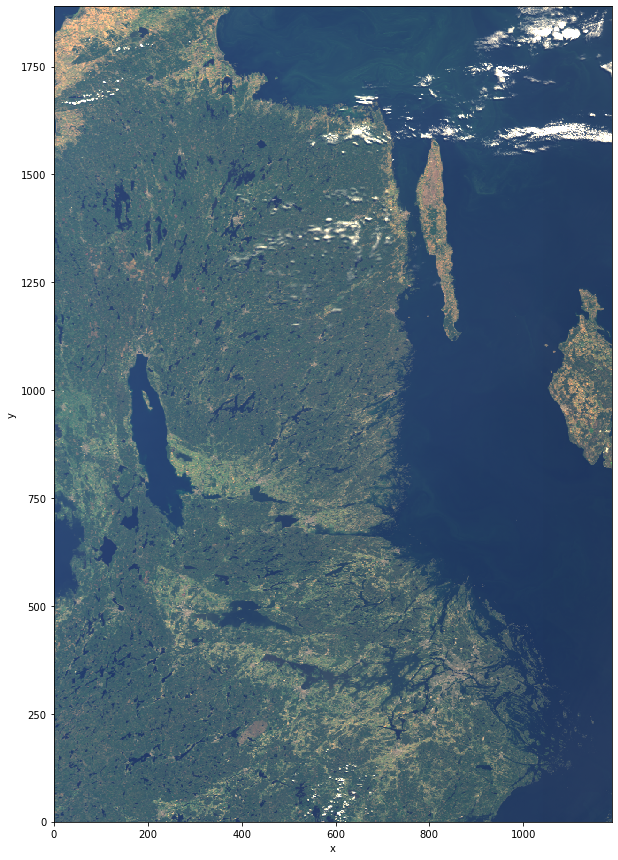

In [4]:
h, w = ds.rtoa_8.shape
fr = 4.5
fg = 4.1
fb = 2.9

rgb_data = np.zeros((h, w, 3), dtype=np.uint8)
rgb_data[:, :, 0] = np.clip(ds.rtoa_8 * fr * 256, 0, 255).astype(np.uint8)
rgb_data[:, :, 1] = np.clip(ds.rtoa_6 * fg * 256, 0, 255).astype(np.uint8)
rgb_data[:, :, 2] = np.clip(ds.rtoa_3 * fb * 256, 0, 255).astype(np.uint8)

rgb_array = xr.DataArray(rgb_data, dims=('y', 'x', 'b'), coords=dict(x=ds.rtoa_8.x, y=ds.rtoa_8.y))
rgb_array.plot.imshow(rgb='b', figsize=(10, 15))

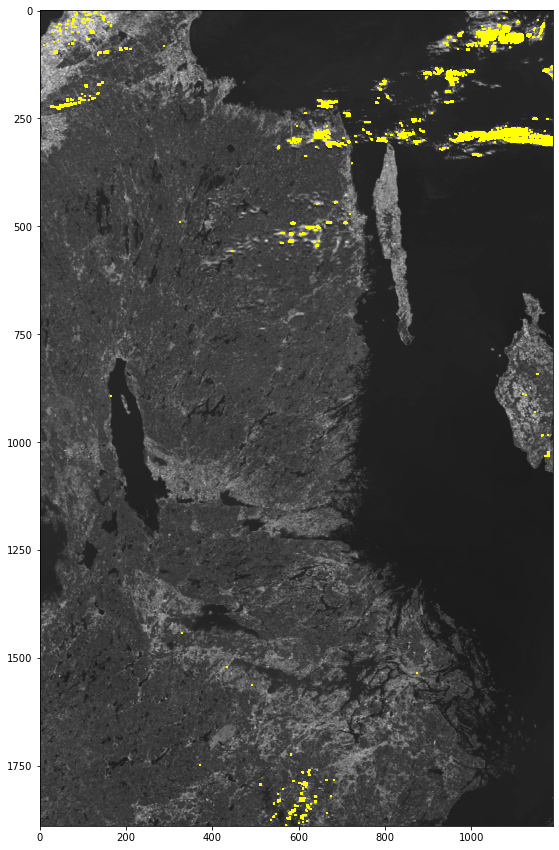

In [5]:
im0 = ds.rtoa_8.data[::-1,...].rechunk((512, 512))

vmin = 0.00
vmax = 0.25

im = da.where(da.logical_or(im0 < vmin, im0 > vmax), np.nan, im0)
imshow_kwargs = dict(vmin=vmin, vmax=vmax, cmap=gray)

plt.figure(figsize=(10, 15))
plt.imshow(im, **imshow_kwargs)

In [6]:
im.dtype, im.shape, im.chunks

(dtype('float32'), (1890, 1189), ((512, 512, 512, 354), (512, 512, 165)))

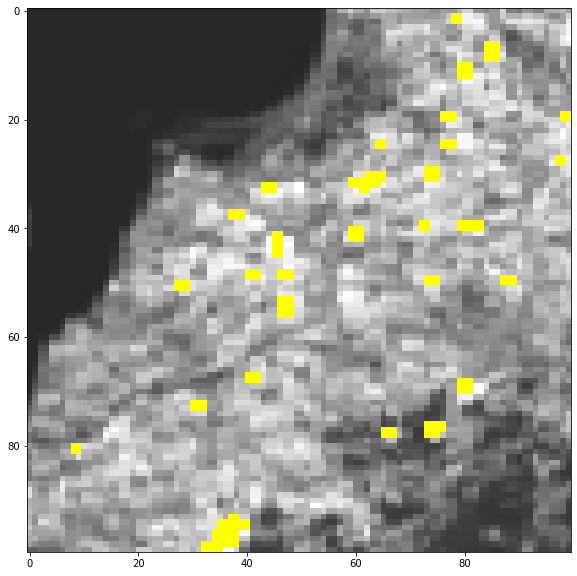

In [7]:
resampled_im = resample_ndimage(im, 1, offset=(0,0), shape=(100,100))
plt.figure(figsize=(10,10))
plt.imshow(resampled_im, **imshow_kwargs)

D:\Miniconda3\envs\xcube\lib\site-packages\dask\array\chunk.py:142: RuntimeWarning: Mean of empty slice
  return reduction(x.reshape(newshape), axis=tuple(range(1, x.ndim * 2, 2)), **kwargs)


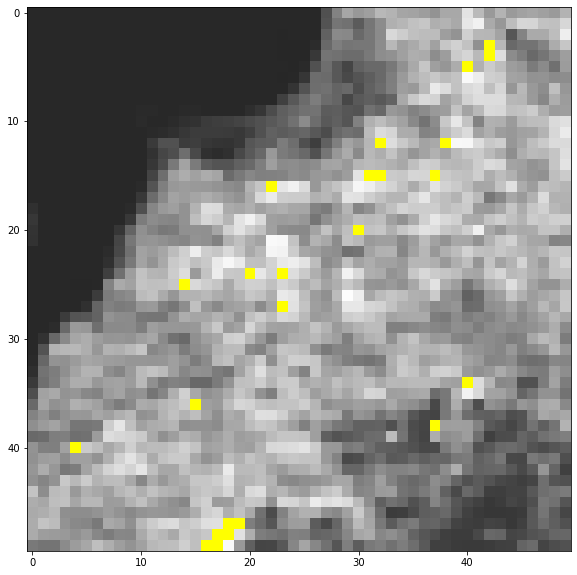

In [8]:
resampled_im = resample_ndimage(im, 2, offset=(0,0), shape=(50,50))
plt.figure(figsize=(10,10))
plt.imshow(resampled_im, **imshow_kwargs)

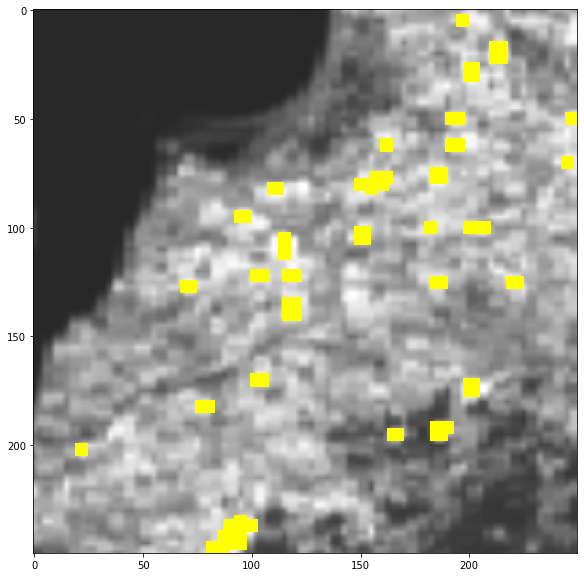

In [9]:
resampled_im = resample_ndimage(im, 1/2.5, offset=(0,0), shape=(250,250))
plt.figure(figsize=(10,10))
plt.imshow(resampled_im, **imshow_kwargs)

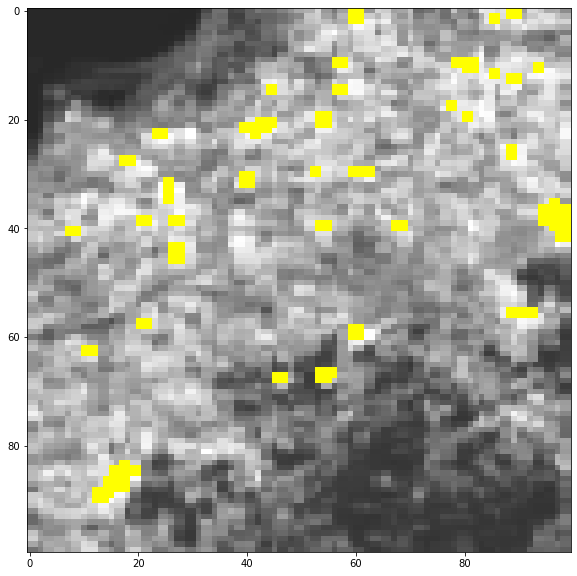

In [10]:
resampled_im = resample_ndimage(im, 1, offset=(10,20), shape=(100,100))
plt.figure(figsize=(10,10))
plt.imshow(resampled_im, **imshow_kwargs)

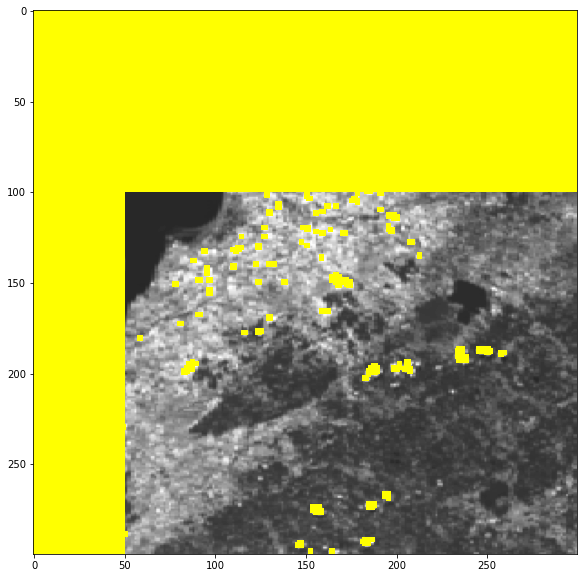

In [11]:
resampled_im = resample_ndimage(im, 1, offset=(-100,-50), shape=(300,300))
plt.figure(figsize=(10,10))
plt.imshow(resampled_im, **imshow_kwargs)

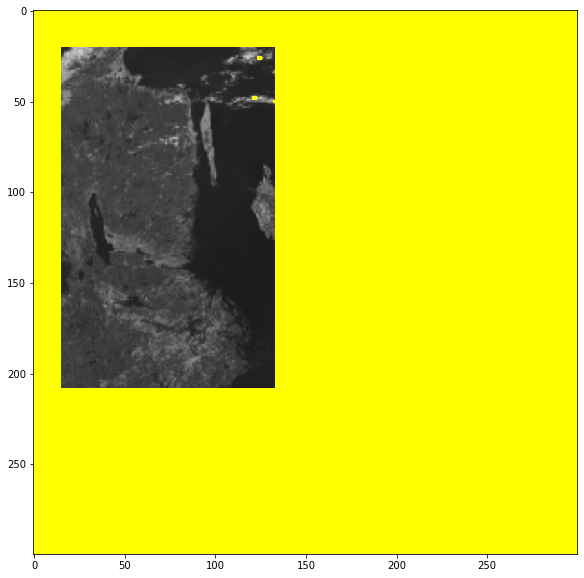

In [12]:
resampled_im = resample_ndimage(im, 10, offset=(-200,-150), shape=(300,300))
plt.figure(figsize=(10,10))
plt.imshow(resampled_im, **imshow_kwargs)

----

In [13]:
scales = [1/4, 3/10, 1/3, 1/2, 2/3, 3/4, 1, 4/3, 3/2, 2/1, 3/1, 10/3, 4/1]

In [14]:
def test_resample_ndimage_forward(im, scales, offset=(0, 0), shape=(100, 100), spline_order=1, recover_nan=False):
    y, x = offset
    h, w = shape
    
    ref_im = im[y:y + h, x:x + w]
    h, w = ref_im.shape

    cols = 4
    rows = (len(scales) + cols - 1) // cols

    fig = plt.figure(1, figsize=(6 * cols, 6 * rows))
    
    ref_mean = da.nanmean(ref_im).compute()
    ref_median = np.nanmedian(np.array(ref_im))
    ref_min = da.nanmin(ref_im).compute()
    ref_max = da.nanmax(ref_im).compute()
    ref_n = (w * h) - da.sum(da.isnan(ref_im)).compute()
    
    scale_series = []

    mean_series = []
    median_series = []
    min_series = []
    max_series = []
    n_series = []

    mean_d_series = []
    median_d_series = []
    min_d_series = []
    max_d_series = []
    n_d_series = []

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        
        for i in range(len(scales)):
            scale = scales[i]
            scaled_im = resample_ndimage(im, 
                                         scale=scale,
                                         offset=offset, 
                                         shape=resize_shape(ref_im.shape, 1/scale), 
                                         spline_order=spline_order,
                                         recover_nan=recover_nan)
            
            scaled_mean = da.nanmean(scaled_im).compute()
            scaled_median = np.nanmedian(np.array(scaled_im))
            scaled_min = da.nanmin(scaled_im).compute()
            scaled_max = da.nanmax(scaled_im).compute()
            scaled_n = (w * h) - da.sum(da.isnan(scaled_im)).compute()

            mean_series.append(scaled_mean)
            median_series.append(scaled_median)
            min_series.append(scaled_min)
            max_series.append(scaled_max)
            n_series.append(scaled_n)

            mean_d_series.append(ref_mean - scaled_mean)
            median_d_series.append(ref_median - scaled_median)
            min_d_series.append(ref_min - scaled_min)
            max_d_series.append(ref_max - scaled_max)
            n_d_series.append(ref_n - scaled_n)
            
            fig.add_subplot(rows, cols, i + 1, title='{:.2f} x'.format(scale))
            plt.imshow(scaled_im, **imshow_kwargs)

    return pd.DataFrame(dict(S=scales,
                             MEAN=mean_series, MEAN_D=mean_d_series, 
                             MED=median_series, MED_D=median_d_series,
                             MIN=min_series, MIN_D=min_d_series,
                             MAX=max_series, MAX_D=max_d_series,
                             N=n_series, N_D=n_d_series))

,S,MEAN,MEAN_D,MED,MED_D,MIN,MIN_D,MAX,MAX_D,N,N_D
0,0.250000,0.131158,0.000768,0.143150,-0.000759,0.038199,0.000000,0.249775,0.000000,6144,3758
1,0.300000,0.131160,0.000766,0.143263,-0.000872,0.038226,-0.000026,0.249748,0.000027,7343,2559
2,0.333333,0.131113,0.000812,0.143145,-0.000754,0.038199,0.000000,0.249775,0.000000,7831,2071
3,0.500000,0.131024,0.000902,0.142787,-0.000396,0.038199,0.000000,0.249775,0.000000,9036,866
4,0.666667,0.130887,0.001039,0.143047,-0.000655,0.038199,0.000000,0.249772,0.000002,9455,447
5,0.750000,0.130979,0.000947,0.143015,-0.000624,0.038265,-0.000066,0.249707,0.000067,9581,321
6,1.000000,0.130760,0.001166,0.141657,0.000734,0.038199,0.000000,0.249775,0.000000,9759,143
7,1.333333,0.131625,0.000301,0.144291,-0.001900,0.038616,-0.000417,0.249685,0.000090,9922,-20
8,1.500000,0.131373,0.000552,0.144470,-0.002079,0.038690,-0.000490,0.243455,0.006319,9923,-21
9,2.000000,0.131688,0.000238,0.144650,-0.002259,0.038710,-0.000510,0.247671,0.002103,9976,-74


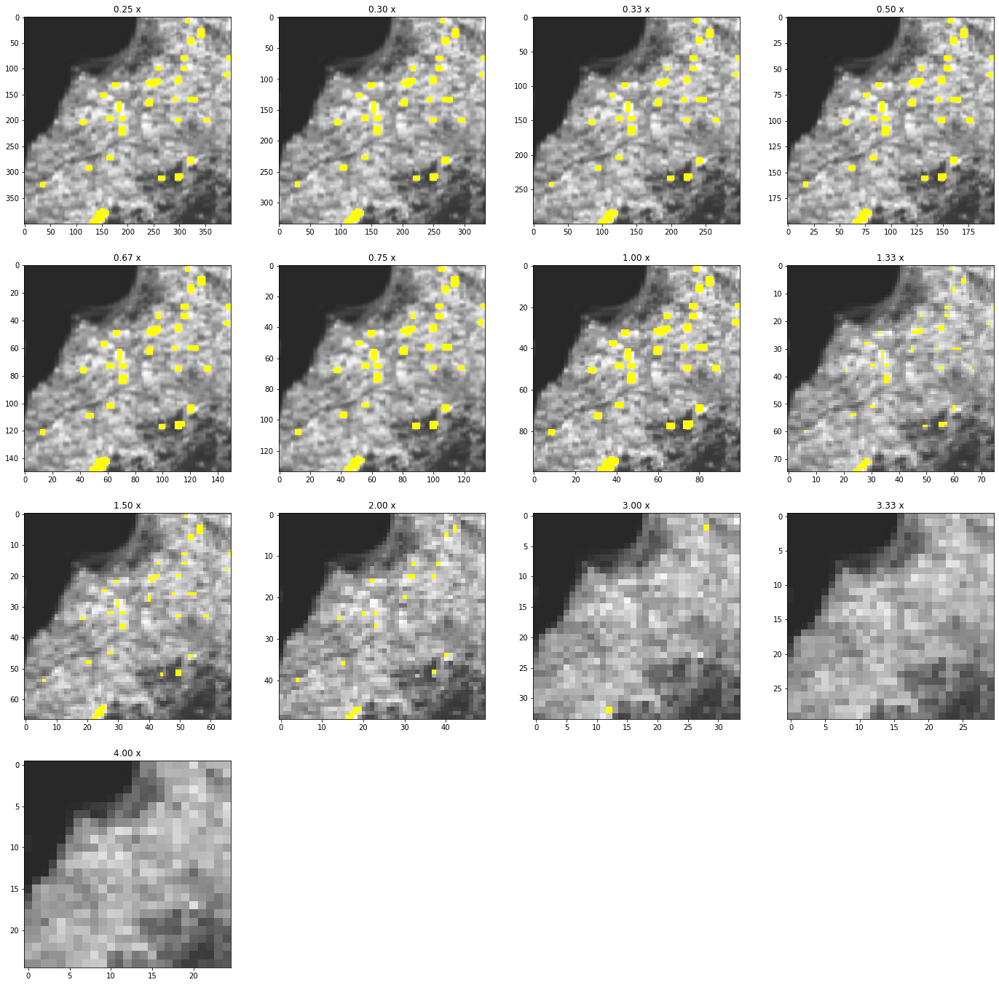

In [15]:
test_resample_ndimage_forward(im, scales, spline_order=1)

,S,MEAN,MEAN_D,MED,MED_D,MIN,MIN_D,MAX,MAX_D,N,N_D
0,0.250000,0.132897,-9.716565e-04,0.144462,-0.002071,0.038199,0.000000,0.249775,0.000000,9521,381
1,0.300000,0.132990,-1.064181e-03,0.144685,-0.002294,0.038226,-0.000026,0.249748,0.000027,9798,104
2,0.333333,0.132802,-8.762614e-04,0.144299,-0.001908,0.038199,0.000000,0.249775,0.000000,9676,226
3,0.500000,0.132602,-6.766392e-04,0.143976,-0.001585,0.038199,0.000000,0.249775,0.000000,9803,99
4,0.666667,0.132576,-6.506625e-04,0.144185,-0.001794,0.038199,0.000000,0.249772,0.000002,9915,-13
5,0.750000,0.132730,-8.042029e-04,0.144255,-0.001864,0.038265,-0.000066,0.249707,0.000067,9954,-52
6,1.000000,0.131926,-6.058205e-09,0.142391,0.000000,0.038199,0.000000,0.249775,0.000000,9902,0
7,1.333333,0.132827,-9.007863e-04,0.144957,-0.002566,0.038616,-0.000417,0.249685,0.000090,9995,-93
8,1.500000,0.132921,-9.949478e-04,0.145376,-0.002984,0.038690,-0.000490,0.248871,0.000903,9999,-97
9,2.000000,0.132726,-7.997770e-04,0.145286,-0.002895,0.038710,-0.000510,0.248871,0.000904,9999,-97


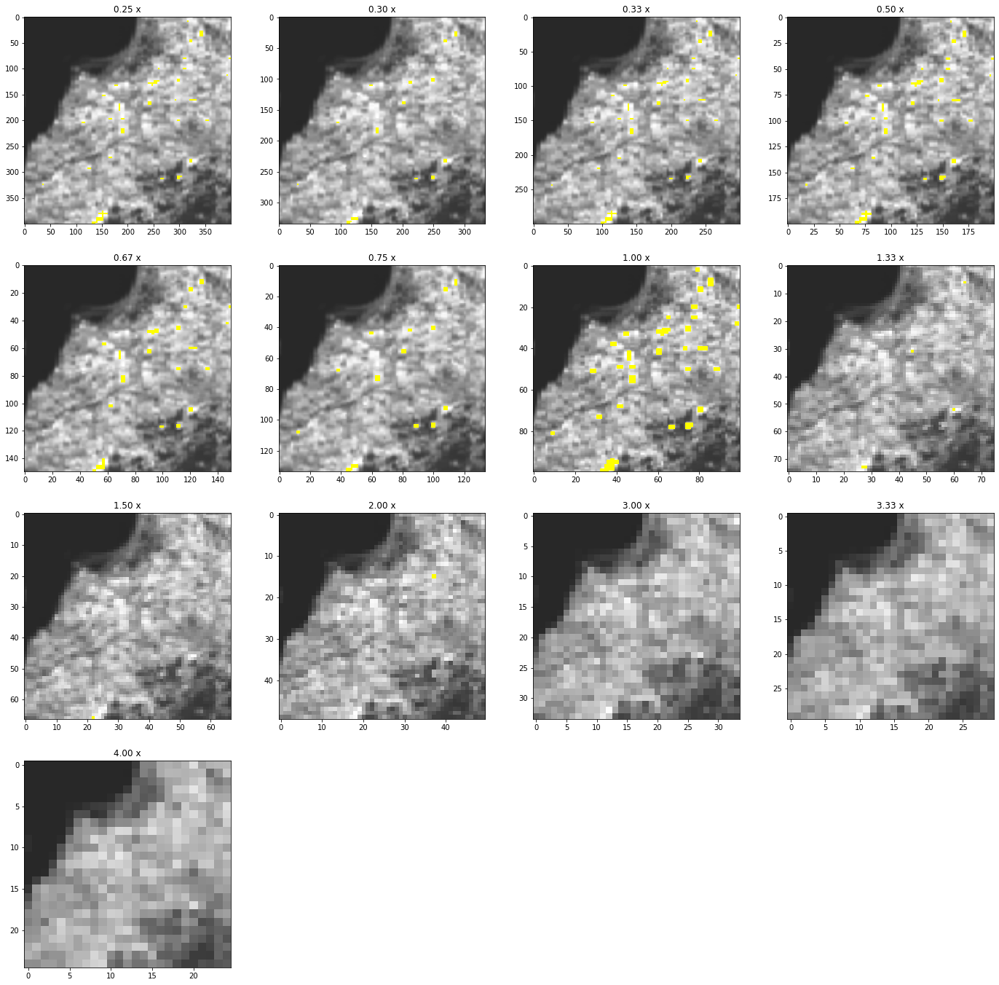

In [16]:
test_resample_ndimage_forward(im, scales, spline_order=1, recover_nan=True)

,S,MEAN,MEAN_D,MED,MED_D,MIN,MIN_D,MAX,MAX_D,N,N_D
0,0.250000,0.132433,-0.000507,0.142690,-0.000299,0.038199,0.000000,0.249775,0.000000,8408,1494
1,0.300000,0.132319,-0.000393,0.142466,-0.000075,0.038199,0.000000,0.249775,0.000000,8851,1051
2,0.333333,0.132265,-0.000339,0.142655,-0.000264,0.038199,0.000000,0.249775,0.000000,9109,793
3,0.500000,0.132433,-0.000507,0.142690,-0.000299,0.038199,0.000000,0.249775,0.000000,9602,300
4,0.666667,0.132226,-0.000301,0.142381,0.000010,0.038199,0.000000,0.249775,0.000000,9782,120
5,0.750000,0.132153,-0.000227,0.142273,0.000118,0.038199,0.000000,0.249775,0.000000,9807,95
6,1.000000,0.131926,0.000000,0.142391,0.000000,0.038199,0.000000,0.249775,0.000000,9902,0
7,1.333333,0.132741,-0.000815,0.144672,-0.002281,0.038369,-0.000169,0.249643,0.000131,9981,-79
8,1.500000,0.132587,-0.000662,0.143488,-0.001096,0.038600,-0.000401,0.249768,0.000007,9974,-72
9,2.000000,0.132726,-0.000800,0.145286,-0.002895,0.038710,-0.000510,0.248871,0.000904,9999,-97


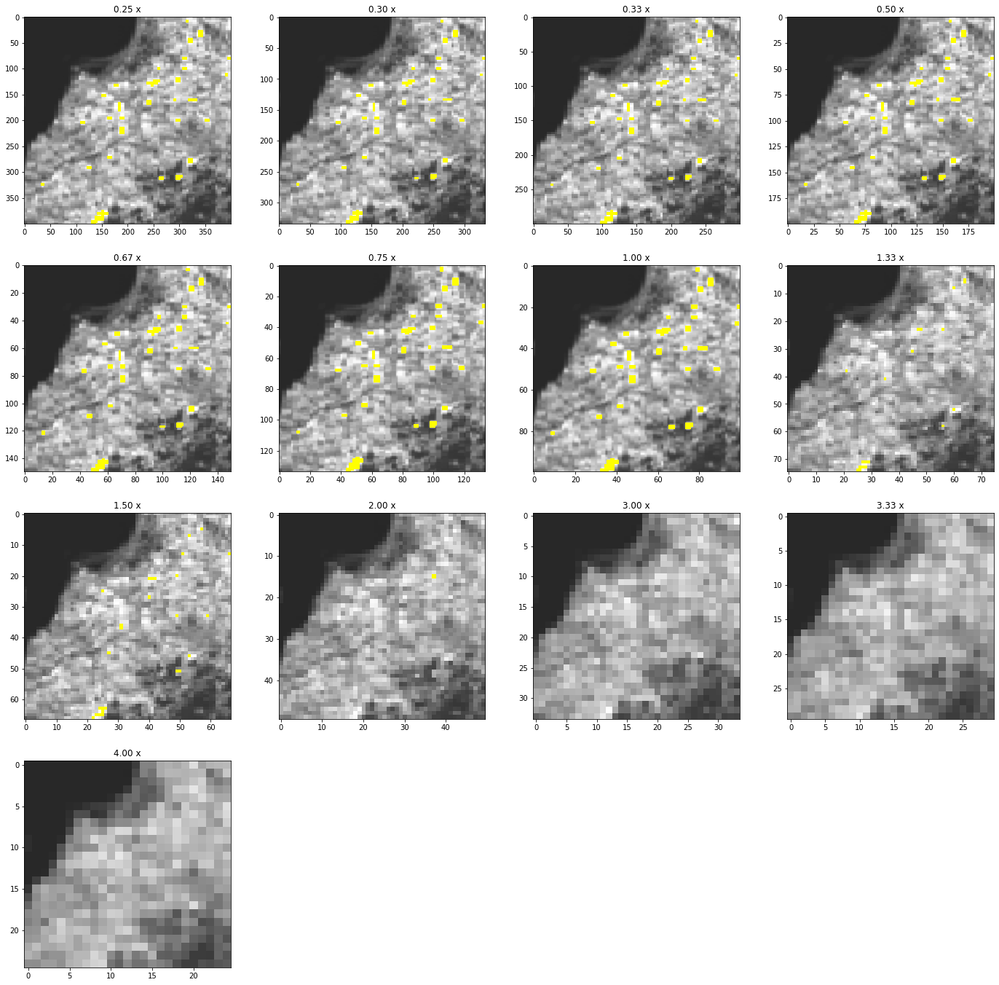

In [17]:
test_resample_ndimage_forward(im, scales, spline_order=0)

,S,MEAN,MEAN_D,MED,MED_D,MIN,MIN_D,MAX,MAX_D,N,N_D
0,0.250000,0.132433,-0.000507,0.142690,-0.000299,0.038199,0.000000,0.249775,0.000000,8408,1494
1,0.300000,0.132319,-0.000393,0.142466,-0.000075,0.038199,0.000000,0.249775,0.000000,8851,1051
2,0.333333,0.132265,-0.000339,0.142655,-0.000264,0.038199,0.000000,0.249775,0.000000,9109,793
3,0.500000,0.132433,-0.000507,0.142690,-0.000299,0.038199,0.000000,0.249775,0.000000,9602,300
4,0.666667,0.132226,-0.000301,0.142381,0.000010,0.038199,0.000000,0.249775,0.000000,9782,120
5,0.750000,0.132153,-0.000227,0.142273,0.000118,0.038199,0.000000,0.249775,0.000000,9807,95
6,1.000000,0.131926,0.000000,0.142391,0.000000,0.038199,0.000000,0.249775,0.000000,9902,0
7,1.333333,0.132741,-0.000815,0.144672,-0.002281,0.038369,-0.000169,0.249643,0.000131,9981,-79
8,1.500000,0.132587,-0.000662,0.143488,-0.001096,0.038600,-0.000401,0.249768,0.000007,9974,-72
9,2.000000,0.132726,-0.000800,0.145286,-0.002895,0.038710,-0.000510,0.248871,0.000904,9999,-97


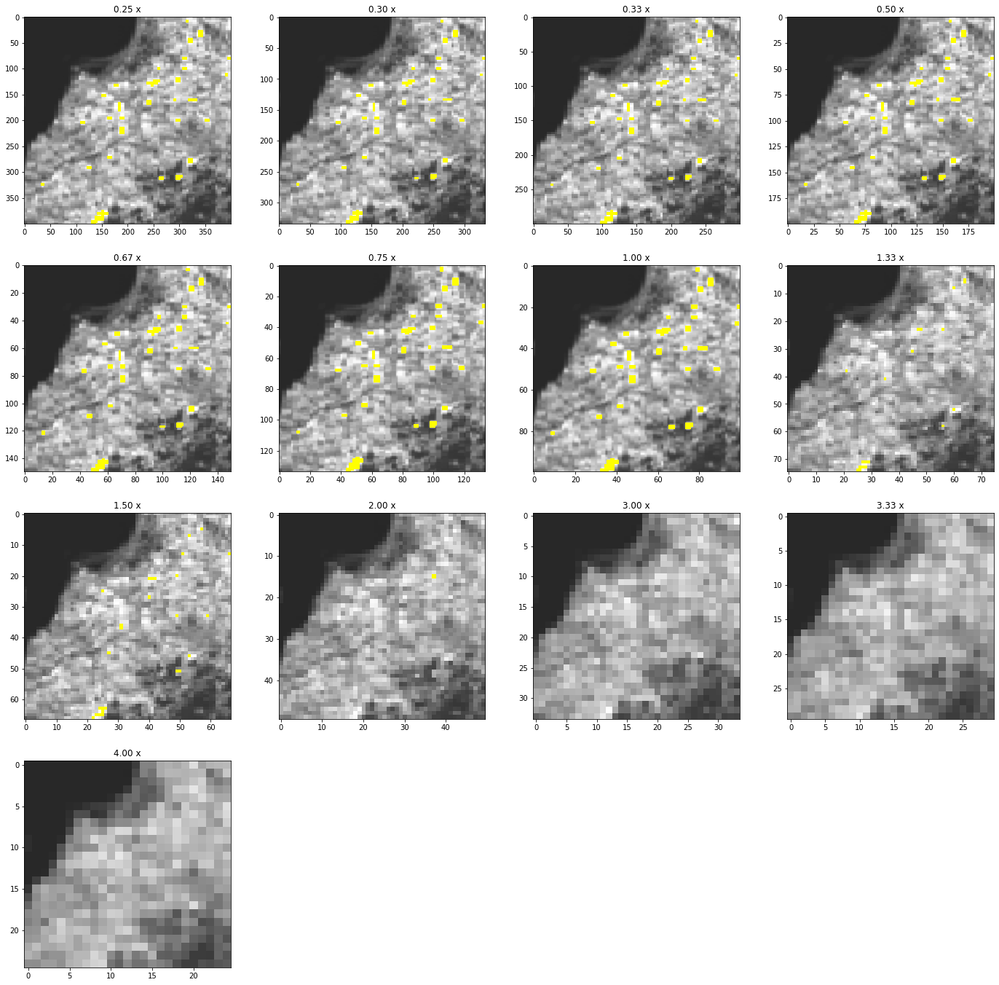

In [18]:
test_resample_ndimage_forward(im, scales, spline_order=0, recover_nan=True)

,S,MEAN,MEAN_D,MED,MED_D,MIN,MIN_D,MAX,MAX_D,N,N_D
0,0.250000,0.128388,0.003538,0.141819,0.000572,0.038626,-0.000426,0.245742,0.004032,-1120,11022
1,0.300000,0.128320,0.003606,0.141693,0.000698,0.038629,-0.000430,0.245810,0.003965,2177,7725
2,0.333333,0.128345,0.003581,0.141728,0.000663,0.038623,-0.000424,0.246047,0.003728,3745,6157
3,0.500000,0.128261,0.003665,0.141731,0.000661,0.038629,-0.000430,0.245742,0.004032,7220,2682
4,0.666667,0.128179,0.003746,0.141597,0.000794,0.038626,-0.000427,0.246047,0.003728,8449,1453
5,0.750000,0.128025,0.003900,0.141474,0.000917,0.038629,-0.000430,0.245742,0.004032,8725,1177
6,1.000000,0.128028,0.003898,0.141419,0.000972,0.038662,-0.000463,0.241866,0.007909,9305,597
7,1.333333,0.129158,0.002768,0.142901,-0.000510,0.038724,-0.000525,0.240746,0.009028,9716,186
8,1.500000,0.128781,0.003145,0.142812,-0.000421,0.038800,-0.000600,0.241489,0.008286,9742,160
9,2.000000,0.129245,0.002680,0.144125,-0.001734,0.038780,-0.000581,0.239918,0.009856,9887,15


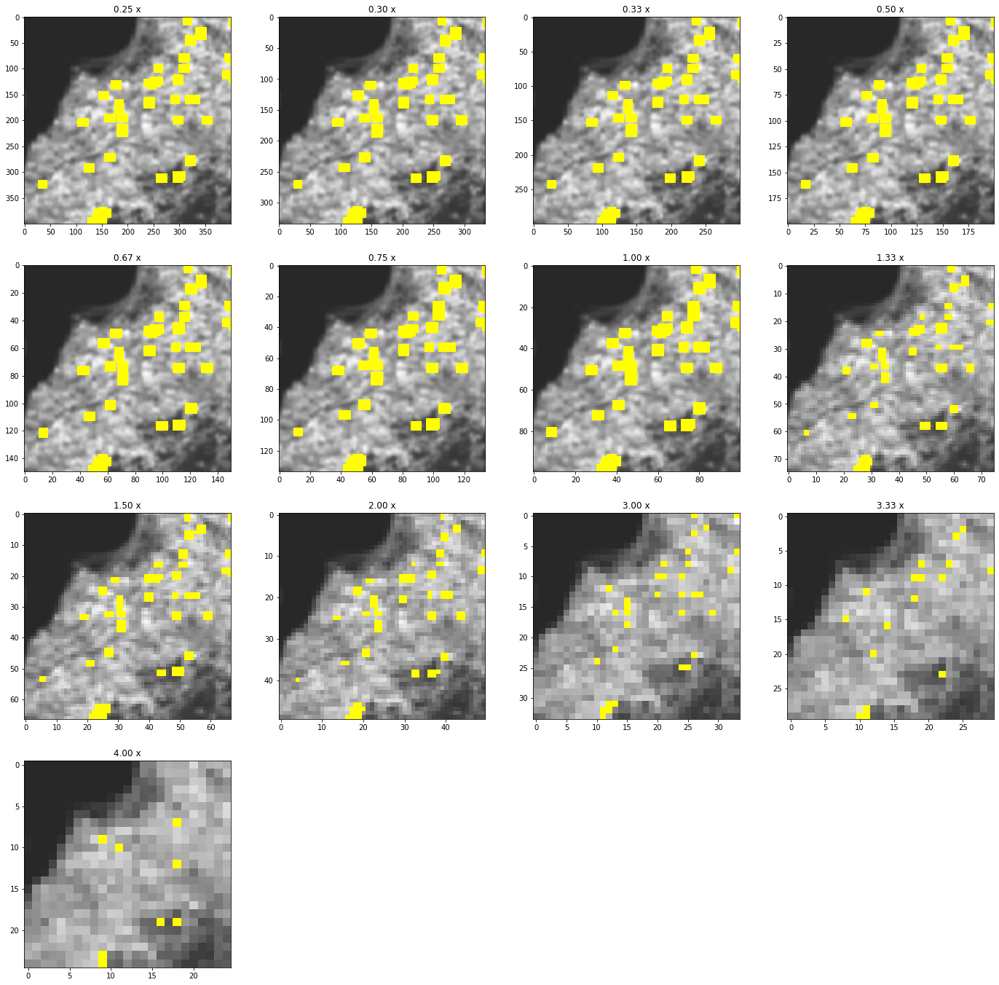

In [19]:
test_resample_ndimage_forward(im, scales, spline_order=3)

,S,MEAN,MEAN_D,MED,MED_D,MIN,MIN_D,MAX,MAX_D,N,N_D
0,0.250000,0.133116,-0.001191,0.145847,-0.003455,0.038626,-0.000426,0.248869,0.000906,10000,-98
1,0.300000,0.133099,-0.001173,0.145818,-0.003427,0.038629,-0.000430,0.248861,0.000914,10000,-98
2,0.333333,0.133073,-0.001147,0.145821,-0.003429,0.038623,-0.000424,0.248869,0.000906,10000,-98
3,0.500000,0.132986,-0.001060,0.145935,-0.003544,0.038629,-0.000430,0.248869,0.000906,10000,-98
4,0.666667,0.132898,-0.000973,0.145805,-0.003413,0.038626,-0.000427,0.248696,0.001079,10000,-98
5,0.750000,0.132881,-0.000955,0.145461,-0.003070,0.038629,-0.000430,0.248750,0.001025,10000,-98
6,1.000000,0.132722,-0.000796,0.145771,-0.003380,0.038662,-0.000463,0.248869,0.000906,10000,-98
7,1.333333,0.132898,-0.000973,0.146221,-0.003830,0.038724,-0.000525,0.244734,0.005040,10000,-98
8,1.500000,0.132881,-0.000955,0.146067,-0.003675,0.038800,-0.000600,0.244839,0.004935,10000,-98
9,2.000000,0.132722,-0.000796,0.147037,-0.004646,0.038780,-0.000581,0.244922,0.004853,10000,-98


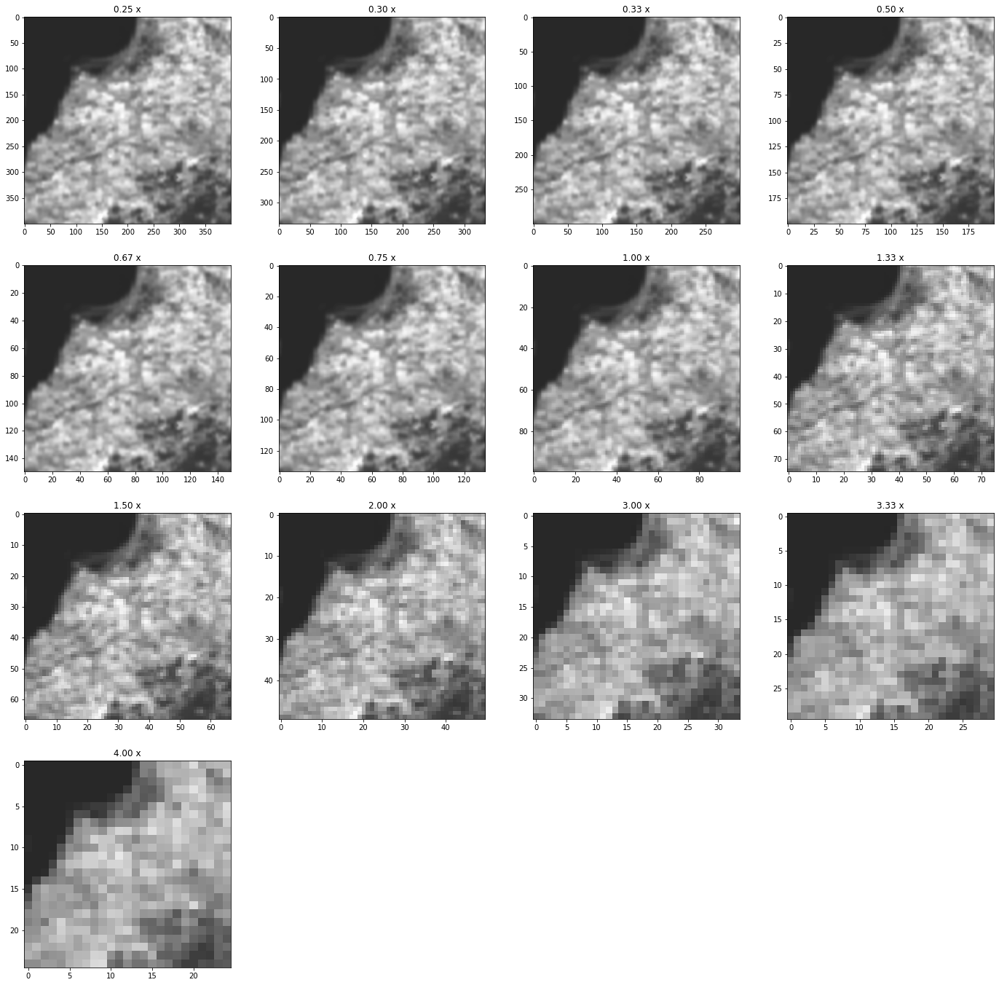

In [20]:
test_resample_ndimage_forward(im, scales, spline_order=3, recover_nan=True)

In [21]:
def test_resample_ndimage_bidi(im, scales, offset=(0, 0), shape=(100, 100), spline_order=1, recover_nan=False):
    y, x = offset
    h, w = shape
    
    ref_im = im[y:y + h, x:x + w]
    h, w = ref_im.shape

    cols = 3
    rows = len(scales)

    fig = plt.figure(1, figsize=(6 * cols, 6 * rows))
    
    rmse_series = []
    n_series = []

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        
        for i in range(len(scales)):
            scale = scales[i]
            scaled_im = resample_ndimage(im, 
                                         scale=scale,
                                         offset=offset, 
                                         shape=resize_shape(shape, 1/scale),
                                         spline_order=spline_order,
                                         recover_nan=recover_nan)
            restored_im = resample_ndimage(scaled_im,
                                           scale=1/scale, 
                                           offset=(-offset[1], -offset[0]), 
                                           shape=ref_im.shape,
                                           spline_order=spline_order,
                                           recover_nan=recover_nan)
            err_im = ref_im - restored_im
            sqr_err_im = err_im * err_im
            n = int(w * h - da.sum(da.isnan(err_im)))
            if n > 0:
                rmse = math.sqrt(da.nansum(sqr_err_im) / n)
            else:
                rmse = float('nan')
            rmse_series.append(rmse)
            n_series.append(n)
            fig.add_subplot(rows, cols, 3*i + 1, title='{:.2f} x'.format(scale))
            plt.imshow(scaled_im, **imshow_kwargs)
            fig.add_subplot(rows, cols, 3*i + 2, title='{:.2f} x'.format(1/scale))
            plt.imshow(restored_im, **imshow_kwargs)
            fig.add_subplot(rows, cols, 3*i + 3, title='RMSE={:.4f}, N={}'.format(rmse, n))
            plt.imshow(err_im, cmap=diverging, vmin=-0.05, vmax=0.05)

    return pd.DataFrame(dict(S=scales, RMSE=rmse_series, N=n_series))

,S,RMSE,N
0,0.250000,0.011299,9759
1,0.300000,0.011632,9759
2,0.333333,0.010136,9759
3,0.500000,0.007753,9759
4,0.666667,0.009097,9754
5,0.750000,0.009563,9759
6,1.000000,0.000000,9759
7,1.333333,0.012754,9413
8,1.500000,0.013497,9546
9,2.000000,0.016222,9424


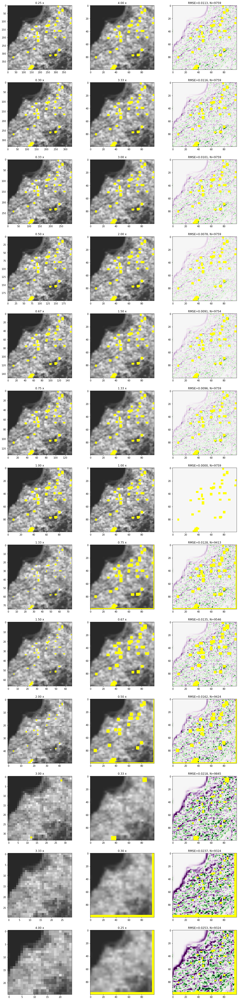

In [22]:
test_resample_ndimage_bidi(im, scales, spline_order=1)

,S,RMSE,N
0,0.250000,0.014734,9902
1,0.300000,0.012899,9902
2,0.333333,0.010163,9902
3,0.500000,0.014734,9902
4,0.666667,0.010804,9902
5,0.750000,0.012117,9902
6,1.000000,0.000000,9902
7,1.333333,0.018274,9692
8,1.500000,0.018678,9865
9,2.000000,0.024445,9704


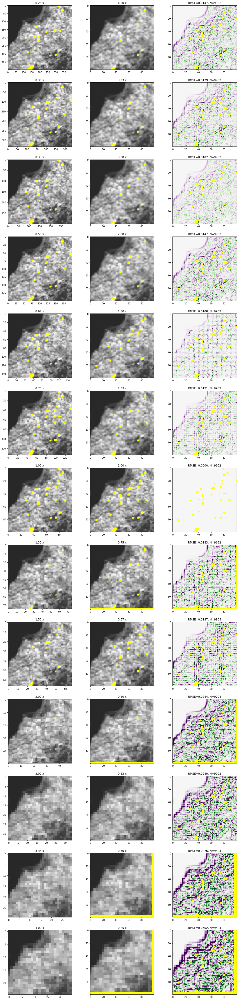

In [23]:
test_resample_ndimage_bidi(im, scales, spline_order=0)

,S,RMSE,N
0,0.250000,0.012653,8684
1,0.300000,0.012828,8587
2,0.333333,0.012129,8684
3,0.500000,0.011153,8684
4,0.666667,0.011922,7564
5,0.750000,0.012205,7488
6,1.000000,0.009207,8684
7,1.333333,0.014220,6347
8,1.500000,0.014873,6183
9,2.000000,0.016448,5373


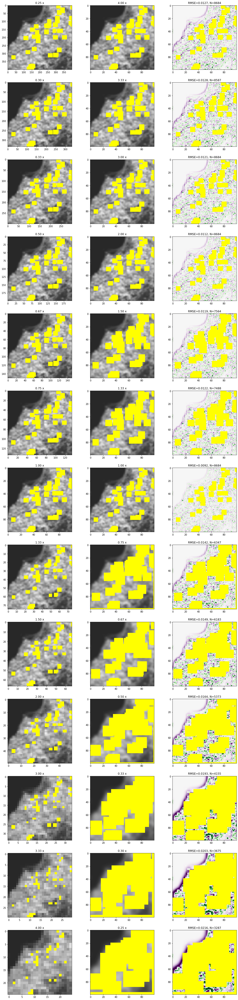

In [24]:
test_resample_ndimage_bidi(im, scales, spline_order=5)

,S,RMSE,N
0,0.250000,0.013412,9902
1,0.300000,0.013607,9902
2,0.333333,0.012862,9902
3,0.500000,0.011839,9902
4,0.666667,0.013170,9902
5,0.750000,0.013470,9902
6,1.000000,0.009798,9902
7,1.333333,0.016456,9707
8,1.500000,0.017371,9902
9,2.000000,0.019624,9707


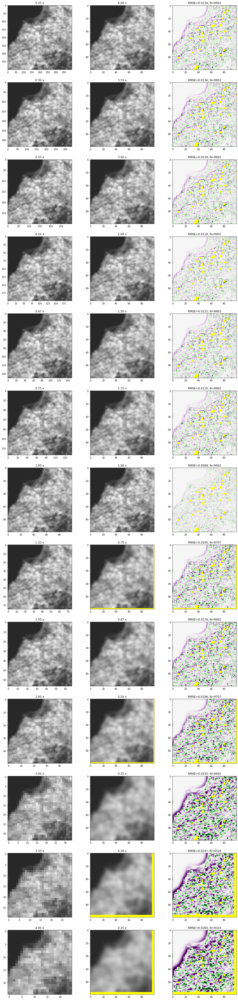

In [25]:
test_resample_ndimage_bidi(im, scales, spline_order=5, recover_nan=True)